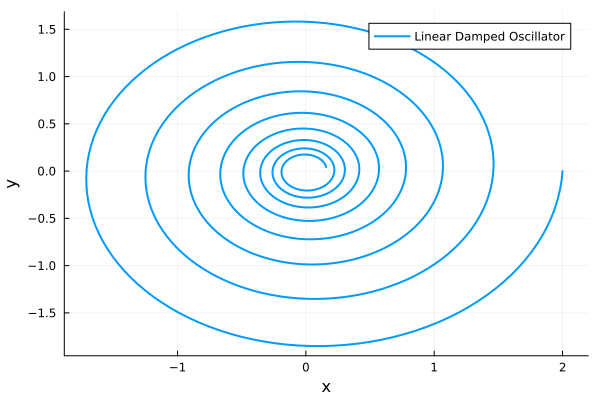

In [75]:
using DifferentialEquations
using Plots

function linear_damped_oscillator!(du, u, p, t)
    du[1] = -0.1u[1] + 2u[2]
    du[2] = - 2u[1] - 0.1u[2]
end

# Initial conditions
u0_linear = [2.0, 0.0]

# Time span
tspan = (0.0, 25.0)

# Solve ODE for linear damped oscillator
prob_linear = ODEProblem(linear_damped_oscillator!, u0_linear, tspan)
sol_linear = solve(prob_linear)

# Plot the results
plot(sol_linear, vars=(1, 2), xlabel="x", ylabel="y", label="Linear Damped Oscillator", linewidth=2)

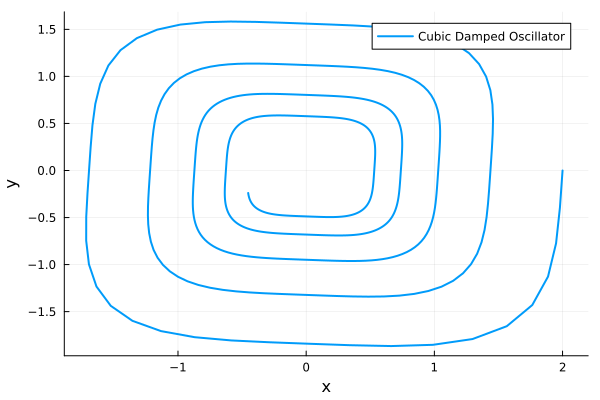

In [20]:
function cubic_damped_oscillator!(du, u, p, t)
    du[1] = -0.1u[1]^3 + 2u[2]^3
    du[2] = - 2u[1]^3 - 0.1u[2]^3
end

# Initial conditions
u0_cubic = [2.0, 0.0]

# Time span
tspan = (0.0, 25.0)

# Solve ODE for cubic damped oscillator
prob_cubic = ODEProblem(cubic_damped_oscillator!, u0_cubic, tspan)
sol_cubic = solve(prob_cubic)

# Plot the results
plot(sol_cubic, vars=(1, 2), xlabel="x", ylabel="y", label="Cubic Damped Oscillator", linewidth=2)

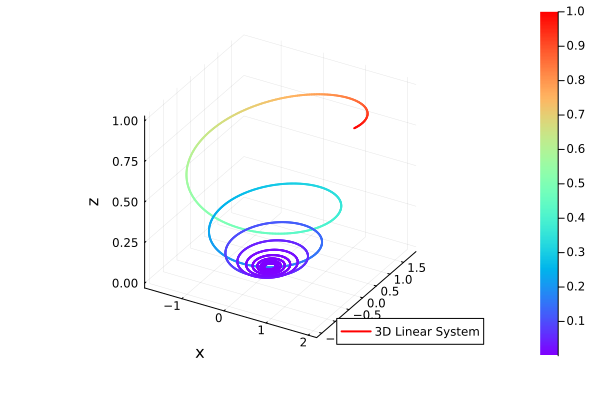

In [81]:
using Plots

function linear_3d_system!(du, u, p, t)
    du[1] = -0.1u[1] - 2u[2]
    du[2] = 2u[1] - 0.1u[2]
    du[3] = -0.3u[3]
end

# Initial conditions
u0_3d_linear = [2.0, 0.0, 1.0]

# Time span
tspan = (0.0, 30.0)

# Solve ODE for three-dimensional linear system
prob_3d_linear = ODEProblem(linear_3d_system!, u0_3d_linear, tspan)
sol_3d_linear = solve(prob_3d_linear, saveat=0.01)

line_z = sol_3d_linear[3, :]
# Plot the results
plot_obj = plot(sol_3d_linear, vars=(1, 2, 3), xlabel="x", ylabel="y", zlabel="z", label="3D Linear System", linewidth=2, linecolor=:auto, color=:rainbow1, line_z=line_z)
display(plot_obj)

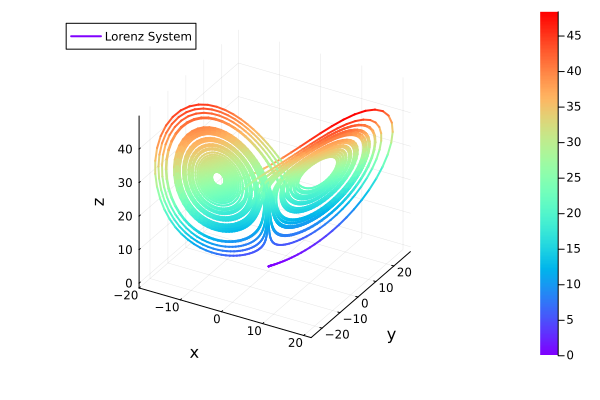

┌ Warning: To maintain consistency with solution indexing, keyword argument vars will be removed in a future version. Please use keyword argument idxs instead.
│   caller = ip:0x0
└ @ Core :-1


In [21]:
using DifferentialEquations
using Plots

function lorenz!(du, u, p, t)
    σ, ρ, β = p
    du[1] = σ * (u[2] - u[1])
    du[2] = u[1] * (ρ - u[3]) - u[2]
    du[3] = u[1] * u[2] - β * u[3]
end

# Initial conditions and common parameters for the Lorenz System
u0 = [0.1, 0.0, 0.0]
p = [10.0, 28.0, 8/3]

# Time span
tspan = (0.0, 60.0) 

# Solve the differential equations
prob = ODEProblem(lorenz!, u0, tspan, p)
sol = solve(prob, Tsit5(), saveat=0.01)  # Reduce the number of data points

# Create an array for line_z representing time
line_z = sol[3, :]

# Plot the results with rainbow gradient
plot_obj = plot(sol, vars=(1, 2, 3), xlabel="x", ylabel="y", zlabel="z", label="Lorenz System",
     linewidth=2, linecolor=:auto, color=:rainbow1, line_z=line_z)
display(plot_obj)


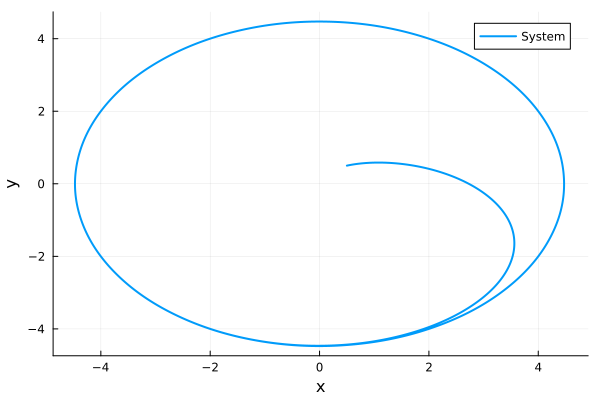

In [23]:
using DifferentialEquations
using Plots

function system!(du, u, p, t)
    μ, ω, A = p
    du[1] = μ * u[1] + ω * u[2] - A * u[1] * (u[1]^2 + u[2]^2)
    du[2] = -ω * u[1] + μ * u[2] - A * u[2] * (u[1]^2 + u[2]^2)
end

# Condições iniciais e parâmetros comuns para o sistema
u0 = [0.5, 0.5]
p = [2.0, 1.0, 0.1]  # μ, ω, A

# Intervalo de tempo
tspan = (0.0, 10.0)

# Resolver as equações diferenciais
prob = ODEProblem(system!, u0, tspan, p)
sol = solve(prob)

# Plotar os resultados
plot(sol, vars=(1, 2), xlabel="x", ylabel="y", label="System", linewidth=2)

# Resolvendo o problema de otimização

In [11]:
using Combinatorics

function generate_theta_2d(X)
    n, p = size(X)
    combinations = []
    for i in 1:p
        push!(combinations, X[:, i])
        push!(combinations, X[:, i].^2)
        push!(combinations, X[:, i].^3)
        push!(combinations, X[:, i].^4)
        push!(combinations, X[:, i].^5)
        for j in i+1:p
            push!(combinations, X[:, i] .* X[:, j])
            push!(combinations, X[:, i].^2 .* X[:, j])
            push!(combinations, X[:, i].^3 .* X[:, j])
            push!(combinations, X[:, i].^4 .* X[:, j])
            push!(combinations, X[:, i] .* X[:, j].^2)
            push!(combinations, X[:, i] .* X[:, j].^3)
            push!(combinations, X[:, i] .* X[:, j].^4)
            push!(combinations, X[:, i].^2 .* X[:, j].^2)
            push!(combinations, X[:, i].^2 .* X[:, j].^3)
        end
    end
    return hcat(combinations...)
end

# Example usage
X = [2 3; 2 4]  # Replace x1, x2, x3 with actual values
theta_matrix = generate_theta(X)

# Print the matrix
println(theta_matrix)


[2 4 8 16 32 6 12 24 48 18 54 162 36 108 10 20 40 80 50 250 1250 100 500 3 9 27 81 243 15 45 135 405 75 375 1875 225 1125 5 25 125 625 3125; 2 4 8 16 32 8 16 32 64 32 128 512 64 256 6 12 24 48 18 54 162 36 108 4 16 64 256 1024 12 48 192 768 36 108 324 144 432 3 9 27 81 243]


In [22]:
using Combinatorics

function generate_theta(X)
    n, p = size(X)
    combinations = []
    for i in 1:p
        push!(combinations, X[:, i])
        push!(combinations, X[:, i].^2)
        push!(combinations, X[:, i].^3)
        push!(combinations, X[:, i].^4)
        push!(combinations, X[:, i].^5)
        for j in i+1:p
            push!(combinations, X[:, i] .* X[:, j])
            push!(combinations, X[:, i].^2 .* X[:, j])
            push!(combinations, X[:, i].^3 .* X[:, j])
            push!(combinations, X[:, i].^4 .* X[:, j])
            push!(combinations, X[:, i] .* X[:, j].^2)
            push!(combinations, X[:, i] .* X[:, j].^3)
            push!(combinations, X[:, i] .* X[:, j].^4)
            push!(combinations, X[:, i].^2 .* X[:, j].^2)
            push!(combinations, X[:, i].^2 .* X[:, j].^3)
            for k in j+1:p  # Loop adicional para a terceira variável
                push!(combinations, X[:, i] .* X[:, j] .* X[:, k])
                push!(combinations, X[:, i].^2 .* X[:, j] .* X[:, k])
                push!(combinations, X[:, i] .* X[:, j].^2 .* X[:, k])
                push!(combinations, X[:, i].^2 .* X[:, j].^2 .* X[:, k])
                push!(combinations, X[:, i].^3 .* X[:, j] .* X[:, k])
                push!(combinations, X[:, i] .* X[:, j].^3 .* X[:, k])
                push!(combinations, X[:, i] .* X[:, j] .* X[:, k].^2)
                push!(combinations, X[:, i].^2 .* X[:, j] .* X[:, k].^2)
                push!(combinations, X[:, i] .* X[:, j].^2 .* X[:, k].^2)
            end
        end
    end
    return hcat(combinations...)
end

# Example usage
X = [2 3 5]  # Replace x1, x2, x3 with actual values
theta_matrix = generate_theta(X)

# Print the matrix
println(theta_matrix)


[2 4 8 16 32 6 12 24 48 18 54 162 36 108 30 60 90 180 120 270 150 300 450 10 20 40 80 50 250 1250 100 500 3 9 27 81 243 15 45 135 405 75 375 1875 225 1125 5 25 125 625 3125]


In [29]:
# Extrair os valores da solução
σ, ρ, β = p
t_values = sol.t
dxdt_values = [σ * (sol[2, i] - sol[1, i]) for i in 1:length(t_values)]
dydt_values = [sol[1, i] * (ρ - sol[3, i]) - sol[2, i] for i in 1:length(t_values)]
dzdt_values = [sol[1, i] * sol[2, i] - β * sol[3, i] for i in 1:length(t_values)]

x_values = sol[1, :]
y_values = sol[2, :]
z_values = sol[3, :]

X_dot = hcat(dxdt_values, dydt_values, dzdt_values)
X = hcat(x_values, y_values, z_values)

theta_matrix = generate_theta(X)

using JuMP, Ipopt
λ = 0.1
m = Model(Ipopt.Optimizer)
set_optimizer_attribute(m, "print_level", 0)

# Corrigir a definição da variável ξ
@variable(m, ξ[1:length(theta_matrix[1,:]), 1:3])
@variable(m, t[1:length(theta_matrix[1,:]), 1:3])

# Adicionar restrições epigráficas
@constraint(m, ξ .<= t)
@constraint(m, -ξ .<= t)

@objective(m, Min, sum((X_dot - theta_matrix*ξ).^2) + λ * sum(t[i, j] for i in 1:length(theta_matrix[1,:]), j in 1:3))
optimize!(m)
#= println(m) =#
ξ_values = value.(ξ)

51×3 Matrix{Float64}:
 -8.93977      26.6986        1.55003e-5
 -0.00773772    0.0106915     0.00074624
 -0.00252767    0.00311537    1.42572e-5
 -8.82265e-6    1.55953e-5   -2.14615e-6
  2.5617e-6    -2.62967e-6    2.91258e-8
 -7.95273e-6   -5.31101e-6    0.997648
 -0.000346819   0.00113664   -5.36769e-5
  1.54375e-5   -2.09529e-5   -7.31005e-6
 -9.37033e-7    4.70039e-7   -1.39187e-8
  0.00362598   -0.00525831    4.95218e-5
  ⋮                          
  3.59457e-5   -4.56738e-5   -2.11669e-8
  2.92389e-8   -4.20857e-8    1.88395e-9
  4.3762e-6    -5.39962e-6   -1.02551e-6
  9.56002e-9   -2.8578e-8     3.3028e-8
 -0.000435275   0.000513849  -2.66571
  0.000106649  -0.000115832  -0.000267659
 -5.07115e-6    3.55433e-6    2.71065e-5
 -8.66715e-8    2.85638e-7   -1.18724e-6
  7.01225e-9   -1.27175e-8    1.91378e-8

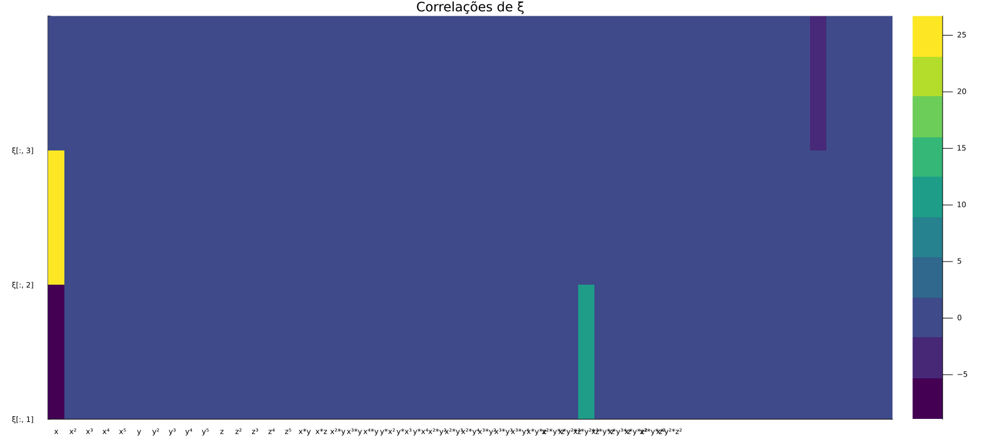

In [41]:
using Plots

# Plotar a esparsidade de ξ
function plot_sparsity(ξ_matrix, column_labels)
    p = heatmap(ξ_matrix', c=cgrad(:viridis, 10, categorical=true), xlabel="", ylabel="Colunas de ξ", yticks=0.5:1:size(ξ_matrix, 2)+0.5, title=["Correlações de ξ" "ξ[:, 2]"], size=(1600, 700))

    # Adicionar rótulos às colunas
    xticks!(1:length(column_labels), column_labels)
    # Adicionar rótulos às linhas
    yticks!(0.5:1:size(ξ_matrix, 2)+0.5, ["ξ[:, $i]" for i in 1:size(ξ_matrix, 2)], valign=:center)
    
    display(p)
end

# Exemplo de uso
column_labels = ["x", "x²", "x³", "x⁴", "x⁵", "y", "y²", "y³", "y⁴", "y⁵", "z", "z²", "z³", "z⁴", "z⁵", "x*y", "x*z", "x²*y", "x³*y", "x⁴*y", "y*x²", "y*x³", "y*x⁴", "x²*y²", "x²*y³", "x²*y⁴", "x³*y²", "x³*y³", "x³*y⁴", "x*y*z", "x²*y*z", "x*y²*z", "x²*y²*z", "x³*y*z", "x*y³*z", "x*y*z²", "x²*y*z²", "x*y²*z²"]
plot_sparsity(ξ_values, column_labels)


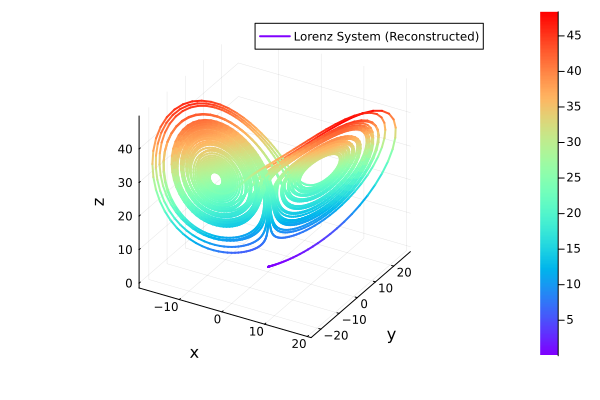

In [25]:
# Extrair as derivadas reconstruídas
xyz_dot_reconstructed = theta_matrix * ξ_values
x_dot_reconstructed = xyz_dot_reconstructed[:, 1]
y_dot_reconstructed = xyz_dot_reconstructed[:, 2]
z_dot_reconstructed = xyz_dot_reconstructed[:, 3]

# Integrar numericamente para obter as variáveis originais
x_reconstructed = cumsum(x_dot_reconstructed) * (t_values[2] - t_values[1])
y_reconstructed = cumsum(y_dot_reconstructed) * (t_values[2] - t_values[1])
z_reconstructed = cumsum(z_dot_reconstructed) * (t_values[2] - t_values[1])

plot_obj = plot(x_reconstructed, y_reconstructed, z_reconstructed, 
     xlabel="x", ylabel="y", zlabel="z", 
     label="Lorenz System (Reconstructed)", 
     linewidth=2, linecolor=:auto, color=:rainbow1, legend=:topright, line_z=z_reconstructed)
display(plot_obj)

# Adicionando Ruído

In [42]:
# Extrair os valores da solução
σ, ρ, β = p
t_values = sol.t
# Adição de ruído às derivadas
noise_intensity = 1
dxdt_values = [σ * (sol[2, i] - sol[1, i]) + noise_intensity * randn() for i in 1:length(sol.t)]
dydt_values = [sol[1, i] * (ρ - sol[3, i]) - sol[2, i] + noise_intensity * randn() for i in 1:length(sol.t)]
dzdt_values = [sol[1, i] * sol[2, i] - β * sol[3, i] + noise_intensity * randn() for i in 1:length(sol.t)]

x_values = sol[1, :]
y_values = sol[2, :]
z_values = sol[3, :]

X_dot = hcat(dxdt_values, dydt_values, dzdt_values)
X = hcat(x_values, y_values, z_values)

theta_matrix = generate_theta(X)

using JuMP, Ipopt
λ = 0.1
m = Model(Ipopt.Optimizer)
set_optimizer_attribute(m, "print_level", 0)

# Corrigir a definição da variável ξ
@variable(m, ξ[1:length(theta_matrix[1,:]), 1:3])
@variable(m, t[1:length(theta_matrix[1,:]), 1:3])

# Adicionar restrições epigráficas
@constraint(m, ξ .<= t)
@constraint(m, -ξ .<= t)

@objective(m, Min, sum((X_dot - theta_matrix*ξ).^2) + λ * sum(t[i, j] for i in 1:length(theta_matrix[1,:]), j in 1:3))
optimize!(m)
#= println(m) =#
ξ_values = value.(ξ)

51×3 Matrix{Float64}:
 -6.82534      32.5261       -0.457328
  0.249612      0.904872      0.334889
 -0.00665916   -0.0111219    -0.00663037
 -0.00105872   -4.85639e-5   -0.00171462
 -5.53406e-5    8.51583e-6   -2.74275e-5
 -0.575435     -1.23974       0.182183
 -0.0486257     0.018114      0.012862
  0.00326721    0.00165979    0.0017512
  0.000113596  -3.35581e-5    3.51945e-5
  0.0756911    -0.0168454    -0.00733655
  ⋮                          
  0.000234644   0.000228768   9.77137e-5
 -1.16275e-6   -1.26752e-6   -1.60782e-6
  0.000328889   0.000390885   0.00016259
  4.20454e-7   -1.52671e-6    4.71174e-6
 -0.0420933    -0.103264     -2.70931
  0.00855356    0.0227853     0.0148814
 -0.000396578  -0.00179975   -0.00167395
 -3.36238e-6    6.08797e-5    7.86018e-5
  3.61081e-7   -7.71533e-7   -1.3588e-6

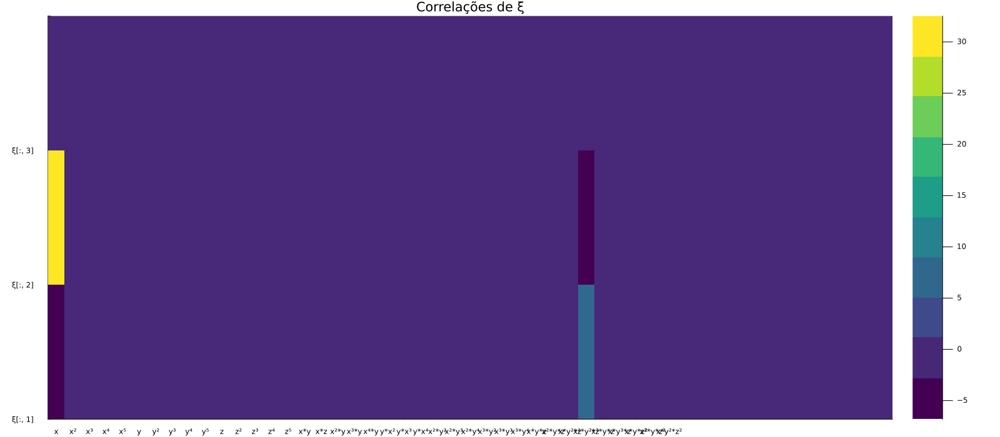

In [43]:
using Plots

# Plotar a esparsidade de ξ
function plot_sparsity(ξ_matrix, column_labels)
    p = heatmap(ξ_matrix', c=cgrad(:viridis, 10, categorical=true), xlabel="", ylabel="Colunas de ξ", yticks=0.5:1:size(ξ_matrix, 2)+0.5, title=["Correlações de ξ" "ξ[:, 2]"], size=(1600, 700))

    # Adicionar rótulos às colunas
    xticks!(1:length(column_labels), column_labels)
    # Adicionar rótulos às linhas
    yticks!(0.5:1:size(ξ_matrix, 2)+0.5, ["ξ[:, $i]" for i in 1:size(ξ_matrix, 2)], valign=:center)
    
    display(p)
end

# Exemplo de uso
column_labels = ["x", "x²", "x³", "x⁴", "x⁵", "y", "y²", "y³", "y⁴", "y⁵", "z", "z²", "z³", "z⁴", "z⁵", "x*y", "x*z", "x²*y", "x³*y", "x⁴*y", "y*x²", "y*x³", "y*x⁴", "x²*y²", "x²*y³", "x²*y⁴", "x³*y²", "x³*y³", "x³*y⁴", "x*y*z", "x²*y*z", "x*y²*z", "x²*y²*z", "x³*y*z", "x*y³*z", "x*y*z²", "x²*y*z²", "x*y²*z²"]
plot_sparsity(ξ_values, column_labels)


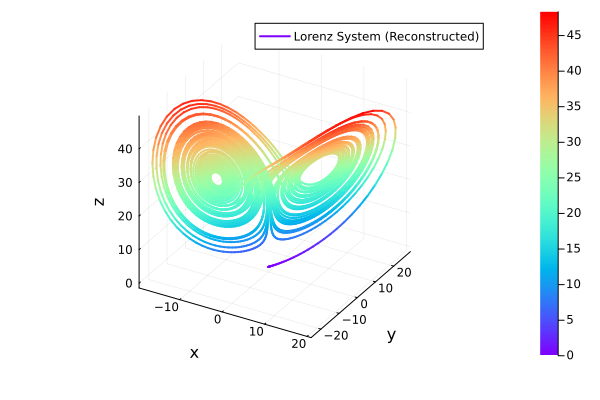

In [44]:
# Extrair as derivadas reconstruídas
xyz_dot_reconstructed = theta_matrix * ξ_values
x_dot_reconstructed = xyz_dot_reconstructed[:, 1]
y_dot_reconstructed = xyz_dot_reconstructed[:, 2]
z_dot_reconstructed = xyz_dot_reconstructed[:, 3]

# Integrar numericamente para obter as variáveis originais
x_reconstructed = cumsum(x_dot_reconstructed) * (t_values[2] - t_values[1])
y_reconstructed = cumsum(y_dot_reconstructed) * (t_values[2] - t_values[1])
z_reconstructed = cumsum(z_dot_reconstructed) * (t_values[2] - t_values[1])

plot_obj = plot(x_reconstructed, y_reconstructed, z_reconstructed, 
     xlabel="x", ylabel="y", zlabel="z", 
     label="Lorenz System (Reconstructed)", 
     linewidth=2, linecolor=:auto, color=:rainbow1, legend=:topright, line_z=z_reconstructed)
display(plot_obj)